# Train `l2hmc` Dynamics

## Imports / setup

In [1]:
%load_ext autoreload
%autoreload 2
%autosave 120
%load_ext rich
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Autosaving every 120 seconds


In [2]:
import matplotx
import matplotlib.pyplot as plt
import seaborn as sns

FIGSIZE = (7, 3)

plt.style.use('default')
colors = {
    'blue': '#007DFF',
    'red': '#FF5252',
    'yellow': '#FFFF00',
    'green': '#63FF5B',
    'purple': '#AE81FF',
    'orange': '#FD971F',
    'white': '#CFCFCF',
}

plt.style.use(matplotx.styles.dufte)
sns.set_palette(list(colors.values()))
sns.set_context('notebook', font_scale=0.8)
plt.rcParams.update({
    'image.cmap': 'viridis',
    'figure.facecolor': (1.0, 1.0, 1.0, 0.),
    'axes.facecolor': (1.0, 1.0, 1.0, 0.),
    'axes.edgecolor': (0, 0, 0, 0.0),
    'figure.edgecolor': (0, 0, 0, 0.0),
    'figure.dpi': plt.rcParamsDefault['figure.dpi'],
    'figure.figsize': plt.rcParamsDefault['figure.figsize'],
})

In [3]:
import os
import sys
from pathlib import Path

modulepath = Path(os.getcwd()).parent.parent.parent
if modulepath.as_posix() not in sys.path:
    sys.path.append(modulepath.as_posix())

## Set floating point precision

In [4]:
# TensorFlow
import tensorflow as tf
tf.keras.backend.set_floatx('float32')  # or 'float64 for double precision
tf.keras.backend.floatx() == tf.float32

# PyTorch
import torch
torch.set_default_dtype(torch.float32)

True

In [5]:
import os
import tensorflow as tf

os.environ['AUTOGRAPH_VERBOSITY'] = '0'
# Verbosity is now 5

tf.autograph.set_verbosity(0)
# Verbosity is now 0

In [6]:
from l2hmc.configs import PROJECT_DIR, HERE
PROJECT_DIR
HERE

PosixPath('/Users/saforem2/projects/l2hmc-qcd')

PosixPath('/Users/saforem2/projects/l2hmc-qcd/src/l2hmc')

In [21]:
import os
from pathlib import Path
from omegaconf import OmegaConf
from hydra import initialize, initialize_config_module, initialize_config_dir, compose
from l2hmc.common import get_timestamp
from l2hmc.common import train as train_common
from l2hmc.configs import CONF_DIR
def train(framework: str = 'tensorflow', overrides: list[str] = None):
    conf_dir = Path(CONF_DIR).resolve().absolute().as_posix()
    day = get_timestamp('%Y-%m-%d')
    time = get_timestamp('%H-%M-%S')
    outdir = Path(os.getcwd()).joinpath('outputs', 'jupyter',
                                        f'{framework}', day, time)
    outdir.mkdir(exist_ok=True, parents=True)
    with initialize_config_dir(config_dir=conf_dir):
        overrides.append(f'framework={framework}')
        overrides.append(f'+outdir={outdir.as_posix()}')
        cfg=compose(
            config_name="config.yaml", 
            overrides=overrides,
        )
        print(OmegaConf.to_yaml(cfg, resolve=True))
        output = train_common(cfg)

    return cfg, output

In [8]:
import torch

def plot_plaqs_diffs(cfg, output, xarr=None):
    dynamics = output['dynamics']
    lattice = output['lattice']
    if xarr is None:
        xarr = output['xarr']

    plaqs = []
    for x in xarr:
        if isinstance(x, torch.Tensor):
            plaqs.append(lattice.plaqs_diff(beta=cfg.get('beta'), x=x).detach().numpy())
        else:
            plaqs.append(lattice.plaqs_diff(beta=cfg.get('beta'), x=x))

    plaqs = np.array(plaqs)
    ndraws, nchains = plaqs.shape
    xplot = np.arange(ndraws)
    with plt.style.context(matplotx.styles.dufte):
        fig, ax = plt.subplots(figsize=FIGSIZE, constrained_layout=True)
        _ = ax.plot(xplot, plaqs.mean(-1), label='avg', lw=2.0, color='C0');
        for idx in range(16):
            _ = ax.plot(xplot, plaqs[:, idx], lw=1.0, alpha=0.5, color='C0')

        _ = ax.set_ylabel(r'$\delta x_{P}$')
        _ = ax.set_xlabel('Train Epoch')
        _ = ax.grid(True, alpha=0.4)

In [9]:
import xarray as xr
from l2hmc.utils.plot_helpers import plot_dataArray, make_ridgeplots

def make_plots(dataset: xr.Dataset, title: str = None):
    plt.rcParams.update({
        'axes.facecolor': (0, 0, 0, 0.0),
        'axes.edgecolor': (0, 0, 0, 0.0),
        'figure.facecolor': (0, 0, 0, 0.0),
        'figure.edgecolor': (0, 0, 0, 0.0),
    })
    with plt.style.context(matplotx.styles.dufte):
        for key, val in dataset.data_vars.items():
            _ = plot_dataArray(val, key=key, num_chains=10, title=title)

In [16]:
base_overrides = [
    'mode=default',
    'save_x=true',
    'beta=1.0',
    'dynamics.verbose=true',
    'dynamics.xshape=[128, 8, 8, 2]',
    'network.units=[16, 16, 16, 16]',
    'steps.nera=10',
    'steps.nepoch=100',
    'steps.print=25',
    'steps.log=10',
    'ignore_warnings=true',
]
options = {
    'merge': ['dynamics.merge_directions=true'],
    'no_merge': ['dynamics.merge_directions=false'],
}
plt.rcParams.update({
    'axes.facecolor': (0, 0, 0, 0.0),
    'axes.edgecolor': (0, 0, 0, 0.0),
    'figure.facecolor': (0, 0, 0, 0.0),
    'figure.edgecolor': (0, 0, 0, 0.0),
})
configs = {
    'tensorflow': {
        'merge': None,
        'no_merge': None,
    },
    'pytorch': {
        'merge': None,
        'no_merge': None,
    },
}
outputs = {
    'tensorflow': {
        'merge': None,
        'no_merge': None,
    },
    'pytorch': {
        'merge': None,
        'no_merge': None,
    },
}

# Train using `tensorflow`

## `DynamicsConfig.merge_directions = True`

beta: 1.0
framework: tensorflow
save_x: true
print_config: true
ignore_warnings: true
seed: null
compile: true
name: null
steps:
  nera: 10
  nepoch: 50
  test: 10
  log: 5
  print: 10
dynamics:
  xshape:
  - 64
  - 8
  - 8
  - 2
  eps: 0.01
  nleapfrog: 3
  eps_fixed: false
  use_ncp: true
  use_split_xnets: true
  use_separate_networks: true
  merge_directions: true
  verbose: true
loss:
  use_mixed_loss: true
  charge_weight: 0.01
  plaq_weight: 0.0
network:
  units:
  - 16
  - 16
  - 16
  - 16
  dropout_prob: 0.0
  activation_fn: relu
  use_batch_norm: false
net_weights:
  x:
    s: 1.0
    t: 1.0
    q: 1.0
  v:
    s: 1.0
    t: 1.0
    q: 1.0
debug_mode: false
width: 150
outdir: /Users/saforem2/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/jupyter/tensorflow/2022-02-01/11-41-07



Output()

[11:41:33] Era 0 took: 23 s                                                                                                             ]8;id=585235;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=906317;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=488536;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=770706;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=2.1, loss=17 , energy=1.3e+02, logdet=-0.012, logprob=1.3e+02, xeps=0.025, veps=0.022, acc=0.94, sumlogdet=-0.01,                       
           acc_mask=0.95

Output()

           Avgs over last era:                                                                                                          ]8;id=544223;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=569238;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.043, loss=6.5, energy=1.2e+02, logdet=-0.045, logprob=1.2e+02, xeps=0.041, veps=0.042, acc=0.86, sumlogdet=-0.042,                    
           acc_mask=0.86

Output()

[11:41:38] Era 2 took: 2.3s                                                                                                             ]8;id=136814;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=820525;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=210440;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=893067;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.051, loss=5.4, energy=1.1e+02, logdet=0.00033, logprob=1.1e+02, xeps=0.054, veps=0.057, acc=0.81, sumlogdet=0.0013,                   
           acc_mask=0.79

Output()

           Avgs over last era:                                                                                                          ]8;id=600493;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=530976;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.05, loss=3.8, energy=1e+02, logdet=0.047, logprob=1e+02, xeps=0.066, veps=0.07, acc=0.79, sumlogdet=0.038,                            
           acc_mask=0.79

Output()

[11:41:43] Era 4 took: 2.4s                                                                                                             ]8;id=867902;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=852561;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=723174;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=2034;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.046, loss=2.7, energy=1e+02, logdet=0.073, logprob=1e+02, xeps=0.079, veps=0.079, acc=0.78, sumlogdet=0.067,                          
           acc_mask=0.8

Output()

[11:41:45] Era 5 took: 2.3s                                                                                                             ]8;id=543390;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=535934;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=40945;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=917303;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.042, loss=-2.2, energy=1e+02, logdet=0.1, logprob=1e+02, xeps=0.093, veps=0.092, acc=0.82, sumlogdet=0.099,                           
           acc_mask=0.83

Output()

[11:41:48] Era 6 took: 2.5s                                                                                                             ]8;id=129623;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=62012;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=715959;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=905971;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.045, loss=-3.9, energy=1e+02, logdet=0.11, logprob=1e+02, xeps=0.11, veps=0.11, acc=0.85, sumlogdet=0.097,                            
           acc_mask=0.84

Output()

[11:41:50] Era 7 took: 2.4s                                                                                                             ]8;id=752115;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=329967;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=167011;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=670927;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.043, loss=-7.2, energy=1e+02, logdet=0.062, logprob=1e+02, xeps=0.12, veps=0.12, acc=0.87, sumlogdet=0.029,                           
           acc_mask=0.88

Output()

[11:41:53] Era 8 took: 2.5s                                                                                                             ]8;id=395336;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=4615;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=219970;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=553053;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.046, loss=-9.8, energy=1e+02, logdet=0.093, logprob=1e+02, xeps=0.14, veps=0.14, acc=0.89, sumlogdet=0.05,                            
           acc_mask=0.88

Output()

[11:41:56] Era 9 took: 2.6s                                                                                                             ]8;id=130069;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=867643;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=276942;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=216043;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.049, loss=-17, energy=1e+02, logdet=0.073, logprob=1e+02, xeps=0.16, veps=0.16, acc=0.89, sumlogdet=0.018, acc_mask=0.9

Text(0.5, 1.0, 'Tensorflow, merge_directions=True')

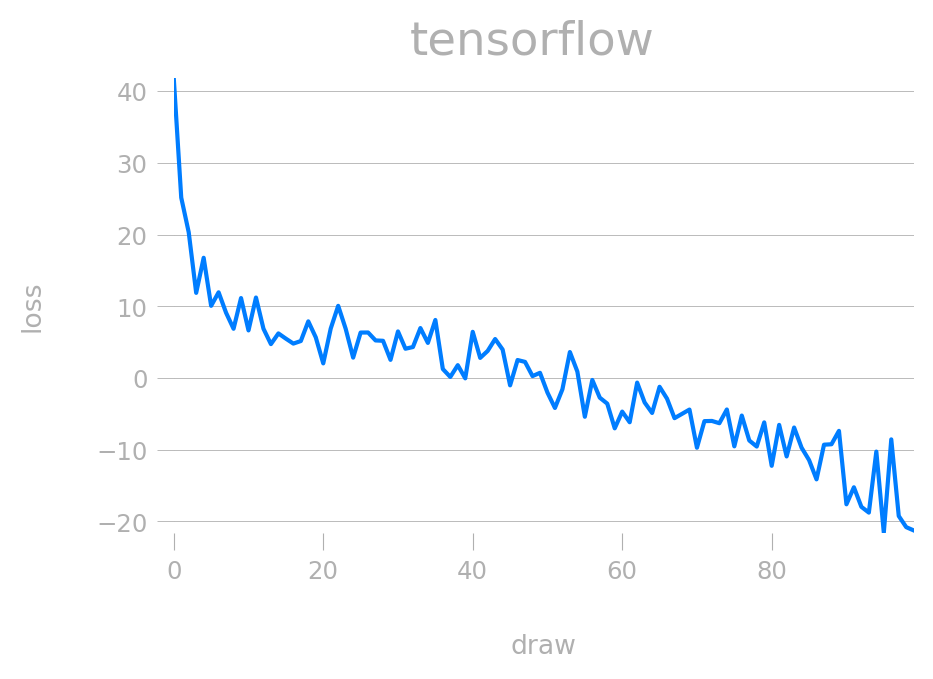

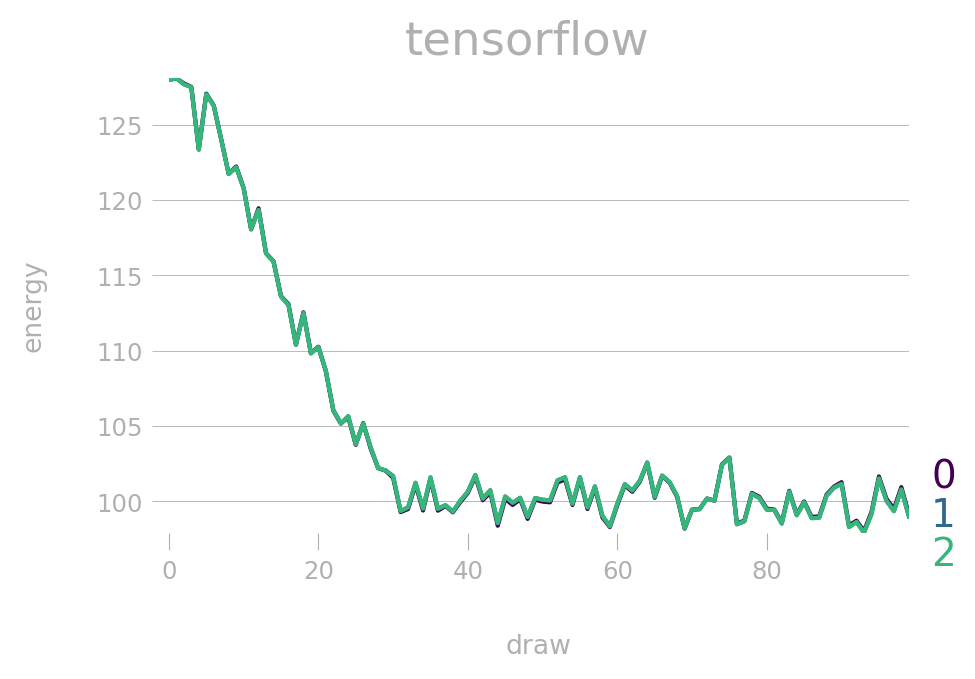

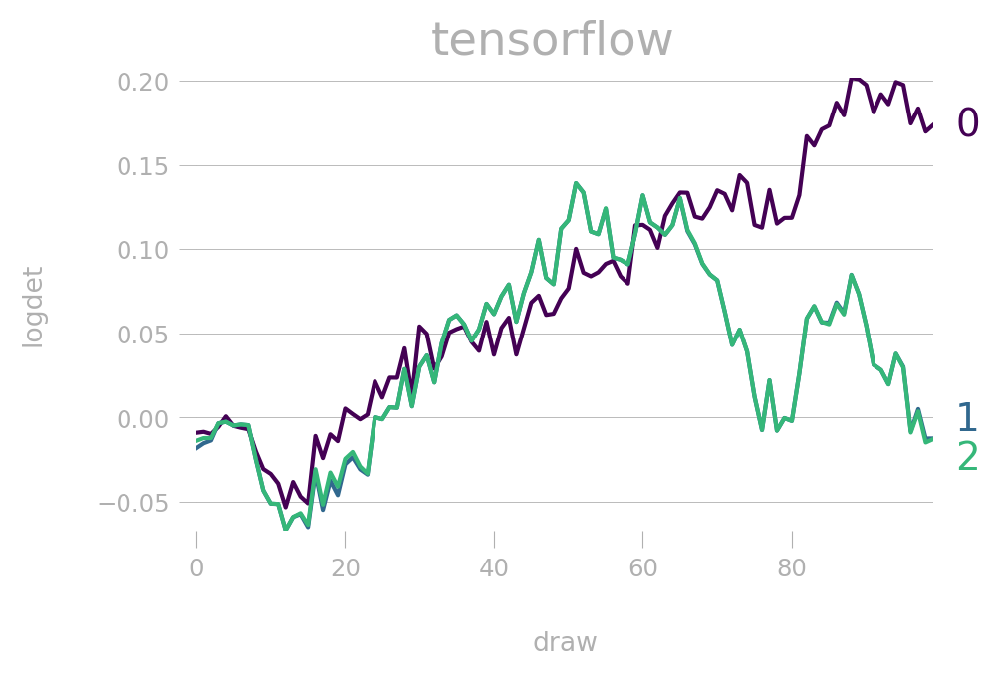

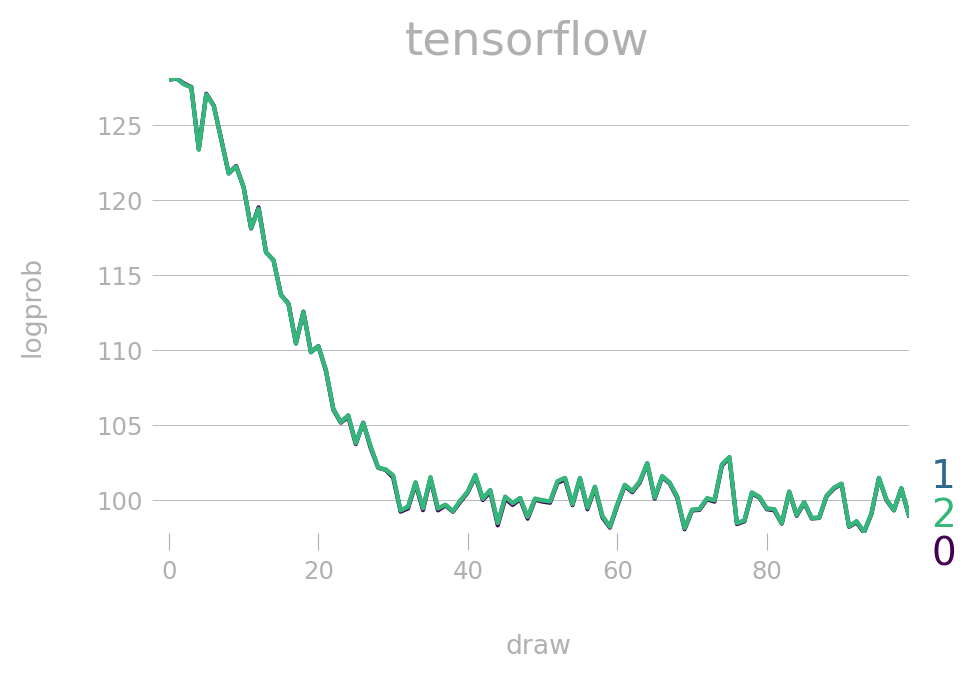

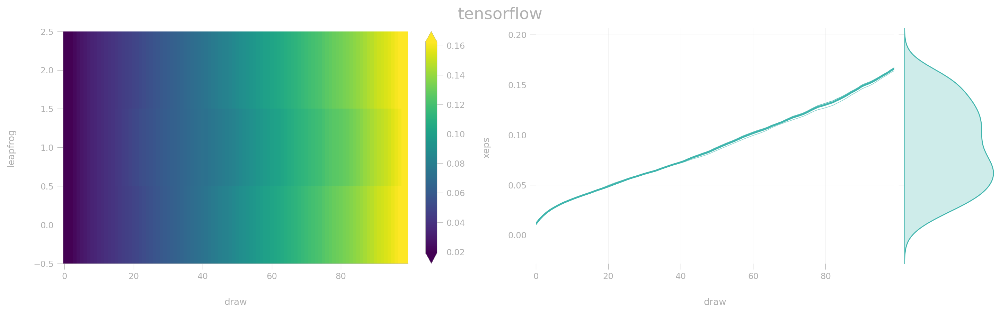

...

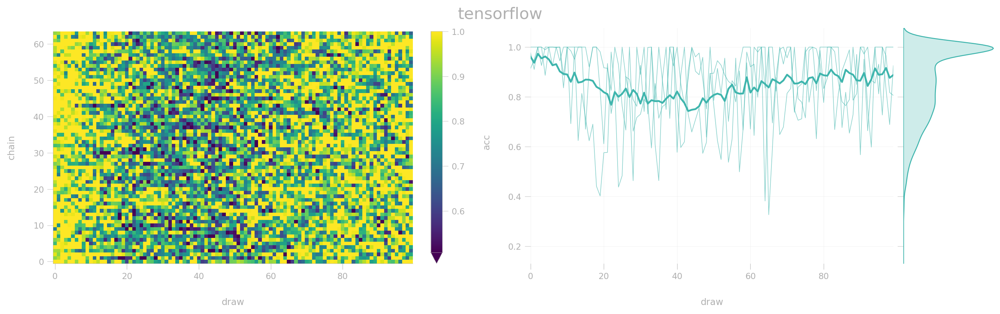

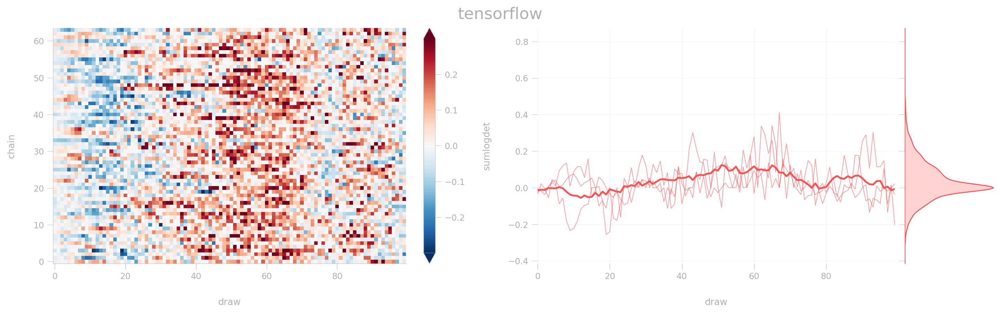

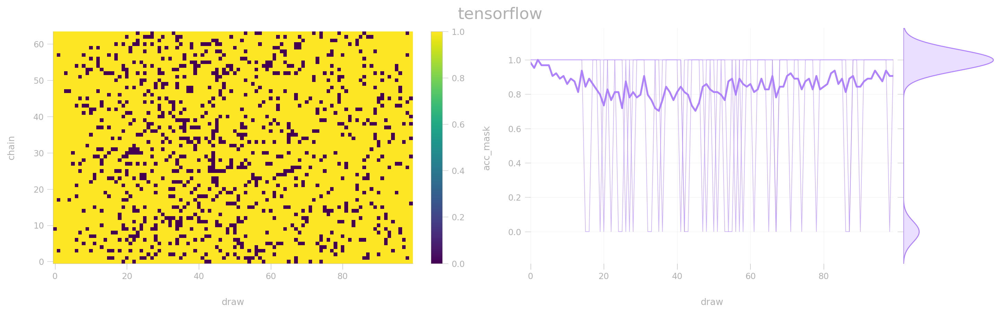

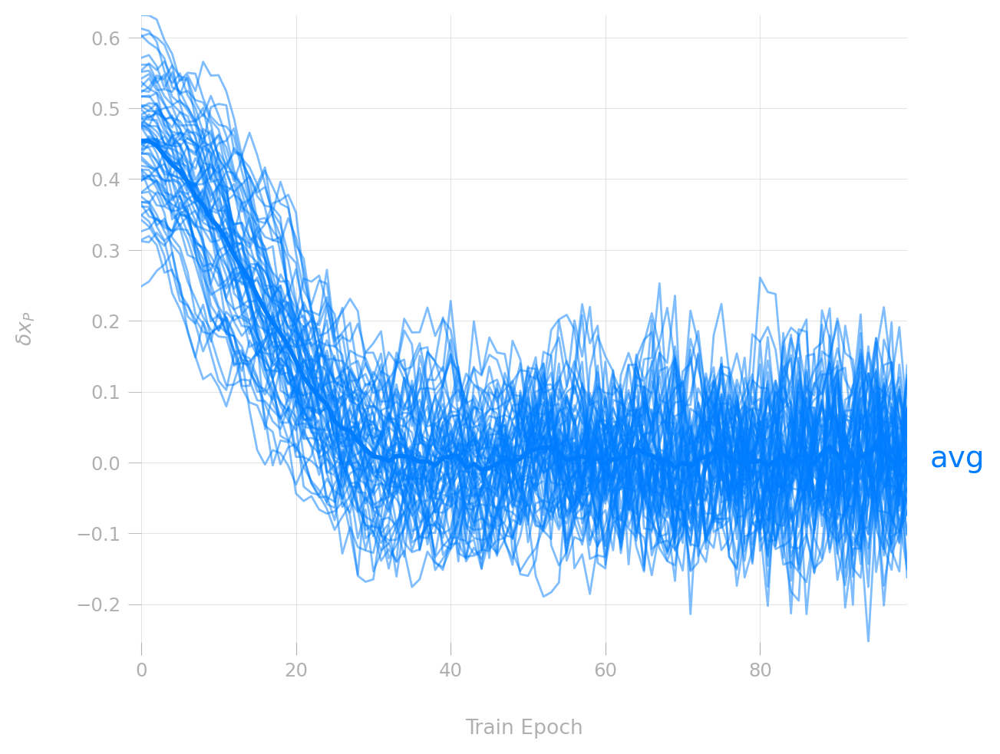

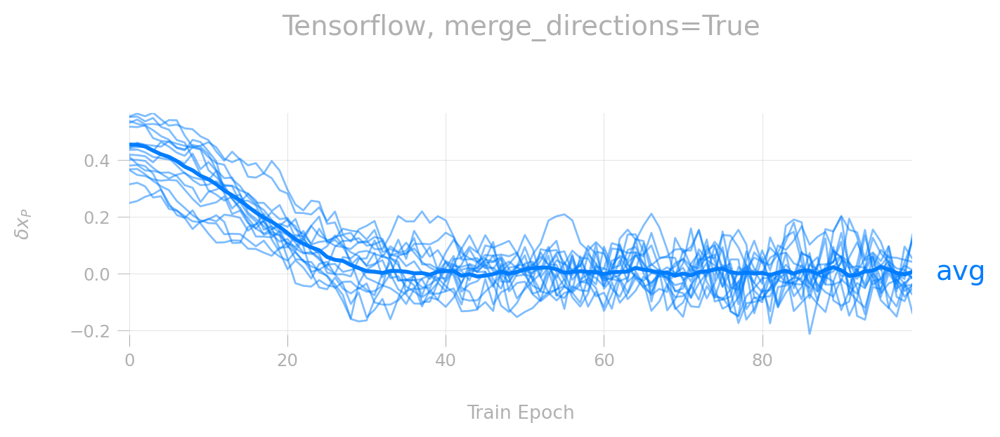

In [29]:
from l2hmc.common import get_timestamp
sns.set_context('notebook', font_scale=0.8)
OPTIONS = [
    'beta=1.0',
    'mode=cpu',
    '+width=150',
    'dynamics.nleapfrog=3',
    'steps=debug',
    'steps.nera=10',
]
with plt.style.context(matplotx.styles.dufte):
    overrides = options['merge'] + OPTIONS
    config, output = train(framework='tensorflow', overrides=overrides)
    outputs['tensorflow']['merge'] = output
    configs['tensorflow']['merge'] = config

    plot_plaqs_diffs(config, output)
    matplotx.line_labels()
    ax = plt.gca()
    ax.set_title('Tensorflow, merge_directions=True')

## `DynamicsConfig.merge_directions = False`

beta: 1.0
framework: tensorflow
save_x: true
print_config: true
ignore_warnings: true
seed: null
compile: true
name: null
steps:
  nera: 10
  nepoch: 50
  test: 10
  log: 5
  print: 10
dynamics:
  xshape:
  - 64
  - 8
  - 8
  - 2
  eps: 0.01
  nleapfrog: 3
  eps_fixed: false
  use_ncp: true
  use_split_xnets: true
  use_separate_networks: true
  merge_directions: false
  verbose: true
loss:
  use_mixed_loss: true
  charge_weight: 0.01
  plaq_weight: 0.0
network:
  units:
  - 16
  - 16
  - 16
  - 16
  dropout_prob: 0.0
  activation_fn: relu
  use_batch_norm: false
net_weights:
  x:
    s: 1.0
    t: 1.0
    q: 1.0
  v:
    s: 1.0
    t: 1.0
    q: 1.0
debug_mode: false
width: 150
outdir: /Users/saforem2/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/jupyter/tensorflow/2022-02-01/11-42-56



Output()

Output()

[11:43:43] Era 1 took: 3  s                                                                                                             ]8;id=863358;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=764645;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=453174;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=202780;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.052, loss=-0.47, acc=0.84, acc_mask=0.83, sumlogdet=-0.0083, fwd/xeps=0.055, fwd/veps=0.048, fwd/energy=1.1e+02,                      
           fwd/logdet=0.077, fwd/logprob=1.1e+02, fwd/acc=0.83, fwd/sumlogdet=0.05, bwd/xeps=0.055, bwd/veps=0.048, bwd/energy=1.1e+02,               
           bwd/logdet=-0.0027, bwd/logprob=1.1e+02, bwd/acc=0.85, bwd/sumlogdet=-0.072

Output()

           Avgs over last era:                                                                                                          ]8;id=49006;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=460998;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.054, loss=-6.6, acc=0.81, acc_mask=0.83, sumlogdet=0.0053, fwd/xeps=0.078, fwd/veps=0.072, fwd/energy=1e+02,                          
           fwd/logdet=0.11, fwd/logprob=1e+02, fwd/acc=0.81, fwd/sumlogdet=0.087, bwd/xeps=0.078, bwd/veps=0.072, bwd/energy=1e+02,                   
           bwd/logdet=-0.02, bwd/logprob=1e+02, bwd/acc=0.81, bwd/sumlogdet=-0.12

Output()

[11:43:50] Era 3 took: 3  s                                                                                                             ]8;id=653582;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=649447;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=982142;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=876327;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.051, loss=-11, acc=0.81, acc_mask=0.81, sumlogdet=-9.7e-05, fwd/xeps=0.1, fwd/veps=0.095, fwd/energy=99 ,                             
           fwd/logdet=0.11, fwd/logprob=99 , fwd/acc=0.81, fwd/sumlogdet=0.038, bwd/xeps=0.1, bwd/veps=0.095, bwd/energy=99 ,                         
           bwd/logdet=0.04, bwd/logprob=99 , bwd/acc=0.81, bwd/sumlogdet=-0.064

Output()

[11:43:53] Era 4 took: 3.2s                                                                                                             ]8;id=359660;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=820107;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=794382;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=919907;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.056, loss=-21, acc=0.78, acc_mask=0.78, sumlogdet=-0.0025, fwd/xeps=0.13, fwd/veps=0.12, fwd/energy=99 ,                              
           fwd/logdet=0.093, fwd/logprob=99 , fwd/acc=0.77, fwd/sumlogdet=0.0017, bwd/xeps=0.13, bwd/veps=0.12, bwd/energy=1e+02,                     
           bwd/logdet=0.052, bwd/logprob=1e+02, bwd/acc=0.79, bwd/sumlogdet=-0.057

Output()

Output()

Output()

[11:44:04] Era 7 took: 3.2s                                                                                                             ]8;id=686068;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=197265;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

Output()

Output()

[11:44:11] Era 9 took: 3.6s                                                                                                             ]8;id=719125;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=296156;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#225\225]8;;\

           Avgs over last era:                                                                                                          ]8;id=186407;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=312180;file:///Users/saforem2/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#228\228]8;;\
           dt=0.074, loss=-50, acc=0.84, acc_mask=0.83, sumlogdet=0.0053, fwd/xeps=0.23, fwd/veps=0.22, fwd/energy=1e+02,                             
           fwd/logdet=0.061, fwd/logprob=1e+02, fwd/acc=0.84, fwd/sumlogdet=-0.11, bwd/xeps=0.23, bwd/veps=0.22, bwd/energy=1e+02,                    
           bwd/logdet=0.19, bwd/logprob=99 , bwd/acc=0.85, bwd/sumlogdet=0.087

Text(0.5, 1.0, 'Tensorflow, merge_directions=False')

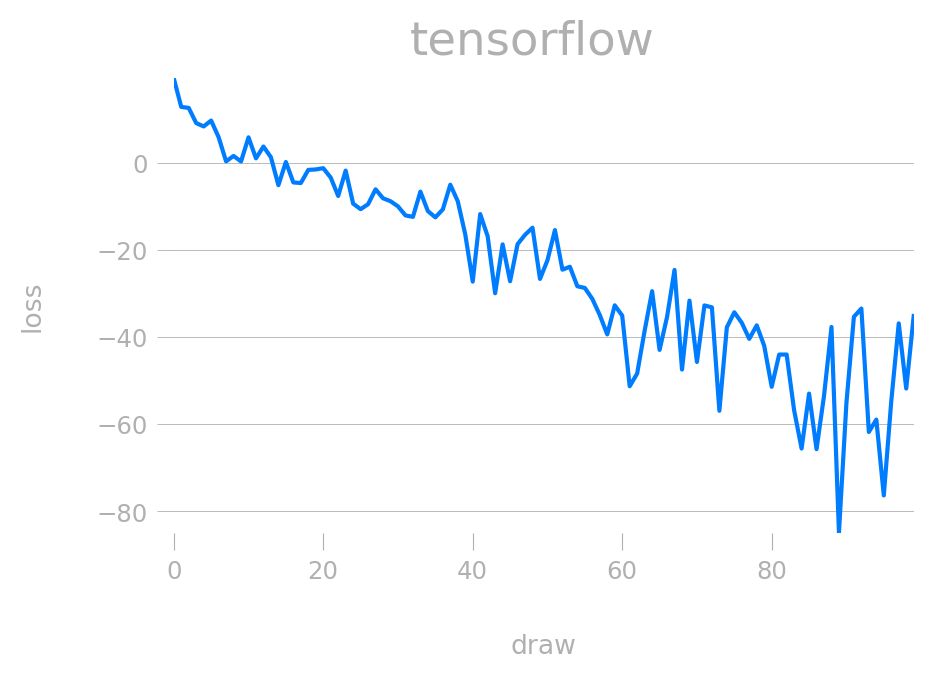

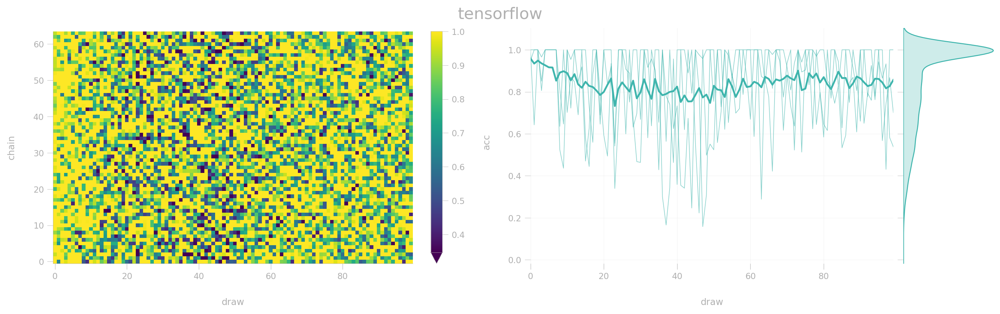

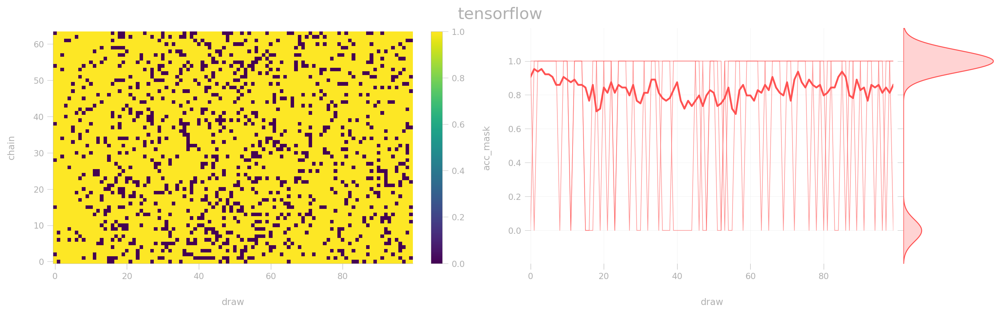

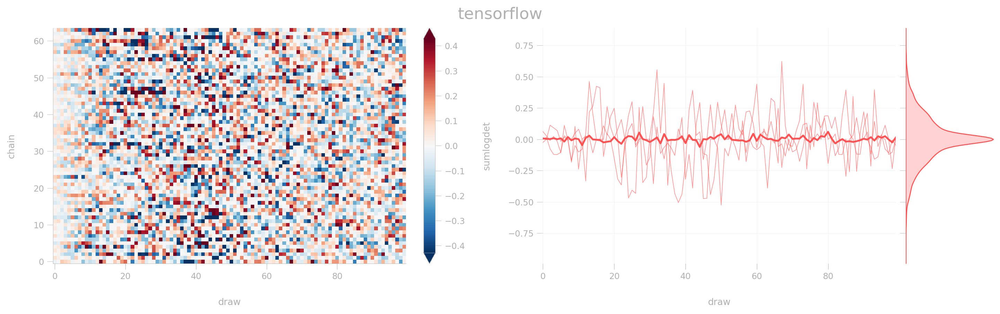

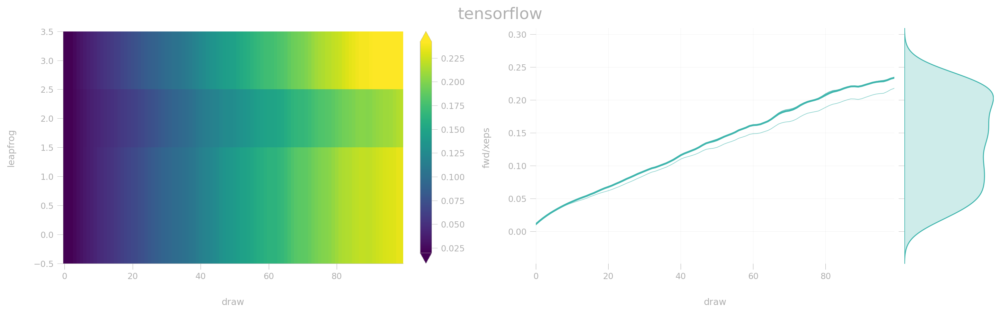

...

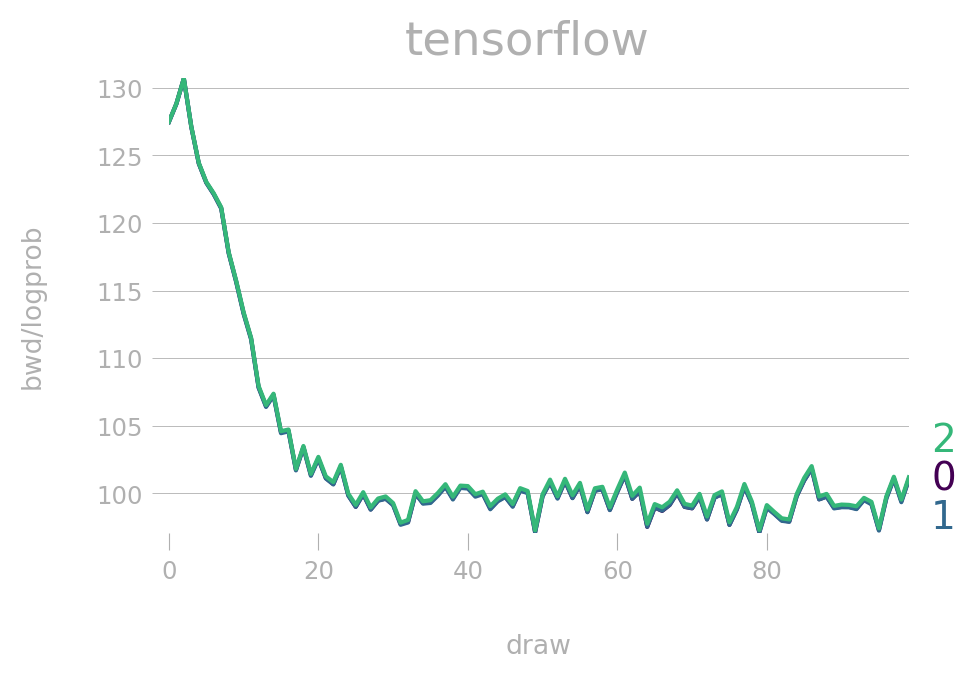

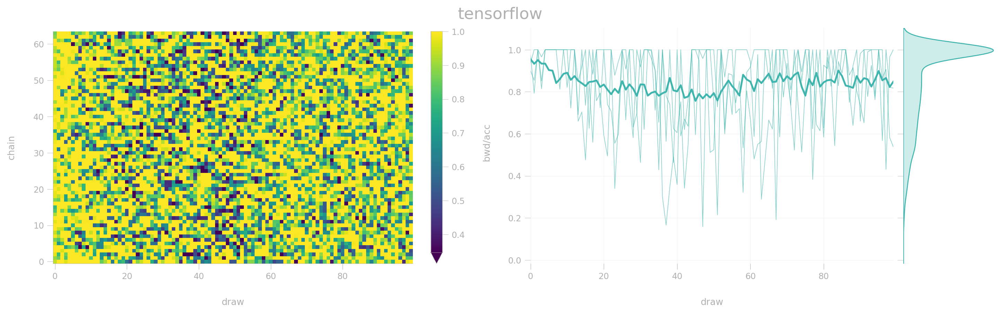

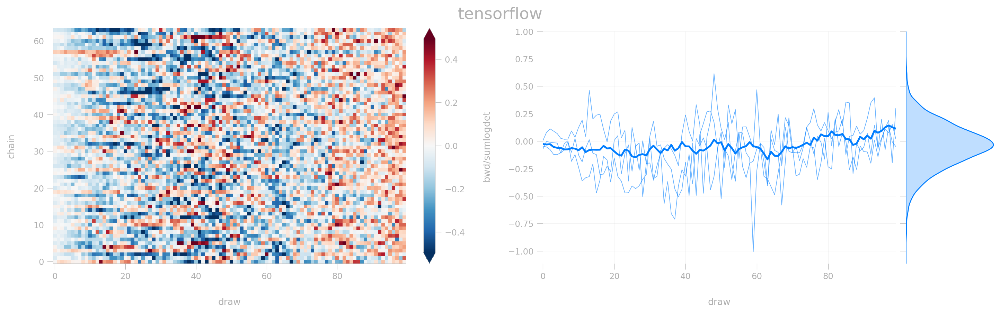

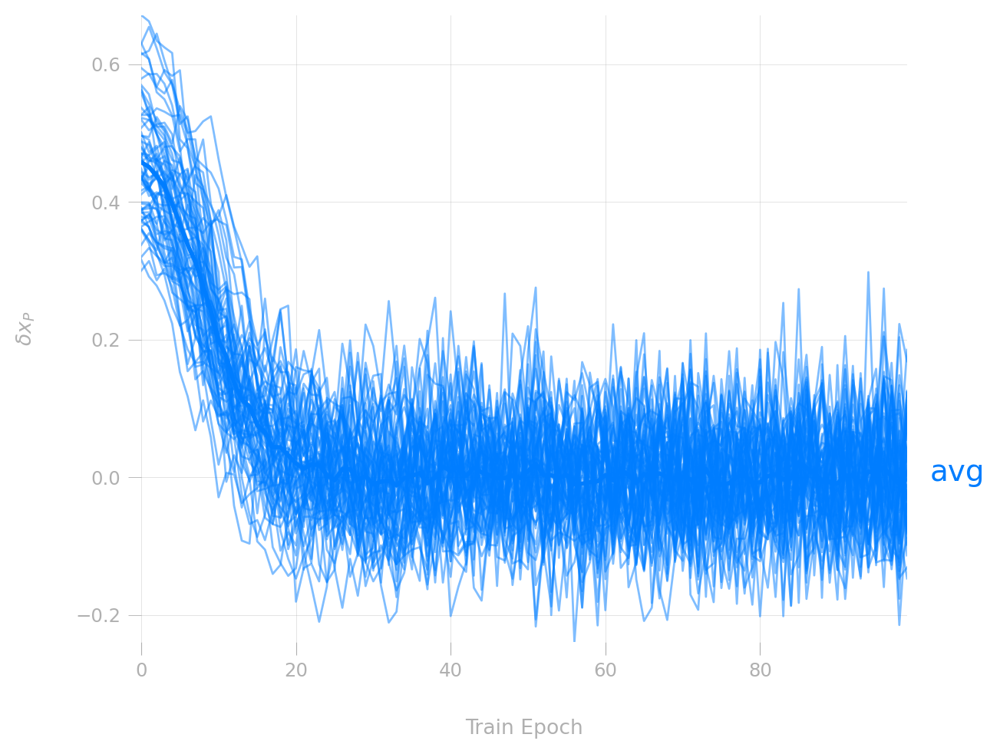

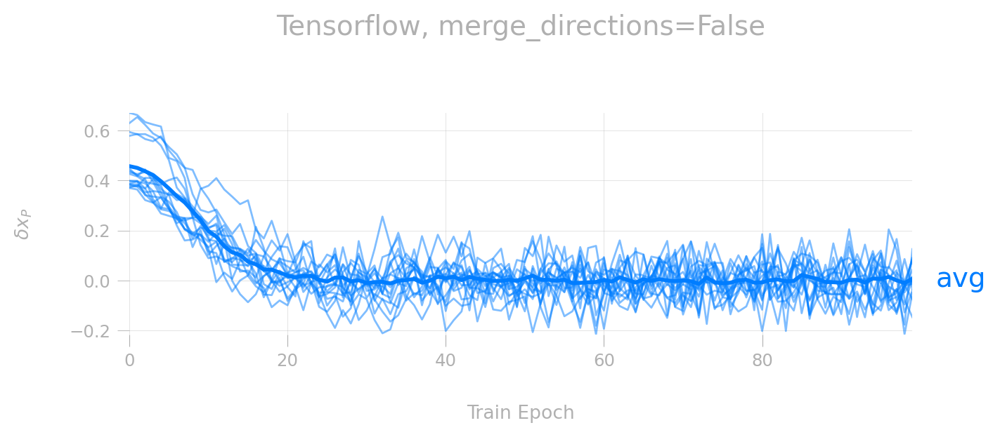

In [30]:
with plt.style.context(matplotx.styles.dufte):
    overrides = options['no_merge'] + OPTIONS
    config, output = train(framework='tensorflow', overrides=overrides)
    outputs['tensorflow']['no_merge'] = output
    configs['tensorflow']['no_merge'] = config

    plot_plaqs_diffs(config, output)
    matplotx.line_labels()
    ax = plt.gca()
    ax.set_title('Tensorflow, merge_directions=False')

# Train using `pytorch`

## `merge_directions = True`

Output()

beta: 1.0
framework: pytorch
save_x: true
print_config: true
ignore_warnings: true
seed: null
compile: true
name: null
steps:
  nera: 10
  nepoch: 50
  test: 10
  log: 5
  print: 10
dynamics:
  xshape:
  - 64
  - 8
  - 8
  - 2
  eps: 0.01
  nleapfrog: 3
  eps_fixed: false
  use_ncp: true
  use_split_xnets: true
  use_separate_networks: true
  merge_directions: true
  verbose: true
loss:
  use_mixed_loss: true
  charge_weight: 0.01
  plaq_weight: 0.0
network:
  units:
  - 16
  - 16
  - 16
  - 16
  dropout_prob: 0.0
  activation_fn: relu
  use_batch_norm: false
net_weights:
  x:
    s: 1.0
    t: 1.0
    q: 1.0
  v:
    s: 1.0
    t: 1.0
    q: 1.0
debug_mode: false
width: 150
outdir: /Users/saforem2/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/jupyter/pytorch/2022-02-01/11-45-57



[11:46:12] Era 0 took: 13 s

           Avgs over last era:                                                                                                                        
            dt=0.24, loss=17 , energy=1.3e+02, logdet=-0.034, logprob=1.3e+02, xeps=0.024, veps=0.021, acc=0.93, sumlogdet=-0.037, acc_mask=0.93

Output()

[11:46:22] Era 1 took: 9.9s

           Avgs over last era:                                                                                                                        
            dt=0.19, loss=6.2, energy=1.1e+02, logdet=-0.13, logprob=1.1e+02, xeps=0.039, veps=0.041, acc=0.76, sumlogdet=-0.12, acc_mask=0.74

Output()

[11:46:32] Era 2 took: 10 s

           Avgs over last era:                                                                                                                        
            dt=0.21, loss=6  , energy=1e+02, logdet=-0.14, logprob=1e+02, xeps=0.047, veps=0.06, acc=0.58, sumlogdet=-0.12, acc_mask=0.58

Output()

[11:46:41] Era 3 took: 9.1s

           Avgs over last era:                                                                                                                        
            dt=0.17, loss=5.6, energy=1e+02, logdet=-0.079, logprob=1e+02, xeps=0.053, veps=0.069, acc=0.55, sumlogdet=-0.07, acc_mask=0.56

Output()

[11:46:51] Era 4 took: 9.3s

           Avgs over last era:                                                                                                                        
            dt=0.21, loss=0.77, energy=99 , logdet=-0.04, logprob=99 , xeps=0.062, veps=0.076, acc=0.63, sumlogdet=-0.05, acc_mask=0.62

Output()

[11:47:00] Era 5 took: 9.1s

Output()

[11:47:09] Era 6 took: 8.7s

           Avgs over last era:                                                                                                                        
            dt=0.19, loss=-7.7, energy=1e+02, logdet=0.078, logprob=1e+02, xeps=0.087, veps=0.09, acc=0.75, sumlogdet=-0.019, acc_mask=0.74

Output()

[11:47:16] Era 7 took: 7.7s

           Avgs over last era:                                                                                                                        
            dt=0.15, loss=-9 , energy=1e+02, logdet=0.11, logprob=1e+02, xeps=0.1, veps=0.097, acc=0.76, sumlogdet=-0.0015, acc_mask=0.74

Output()

[11:47:24] Era 8 took: 7.8s

           Avgs over last era:                                                                                                                        
            dt=0.14, loss=-16, energy=1e+02, logdet=0.26, logprob=1e+02, xeps=0.12, veps=0.11, acc=0.76, sumlogdet=0.17, acc_mask=0.78

Output()

[11:47:31] Era 9 took: 6.5s

           Avgs over last era:                                                                                                                        
            dt=0.1, loss=-22, energy=1e+02, logdet=0.37, logprob=1e+02, xeps=0.14, veps=0.14, acc=0.79, sumlogdet=0.22, acc_mask=0.8

Text(0.5, 1.0, 'PyTorch, merge_directions=True')

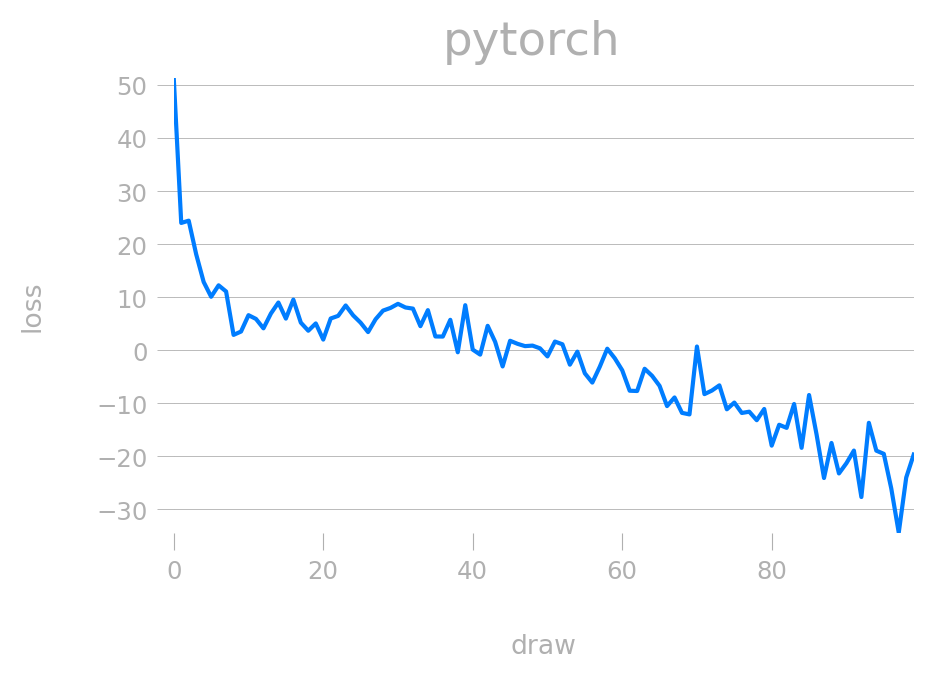

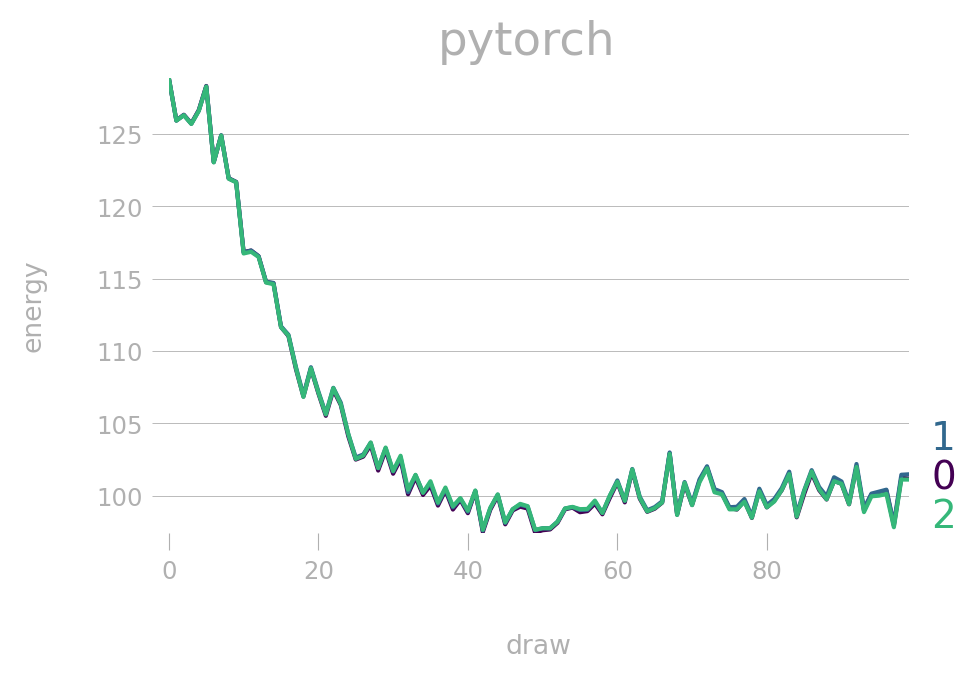

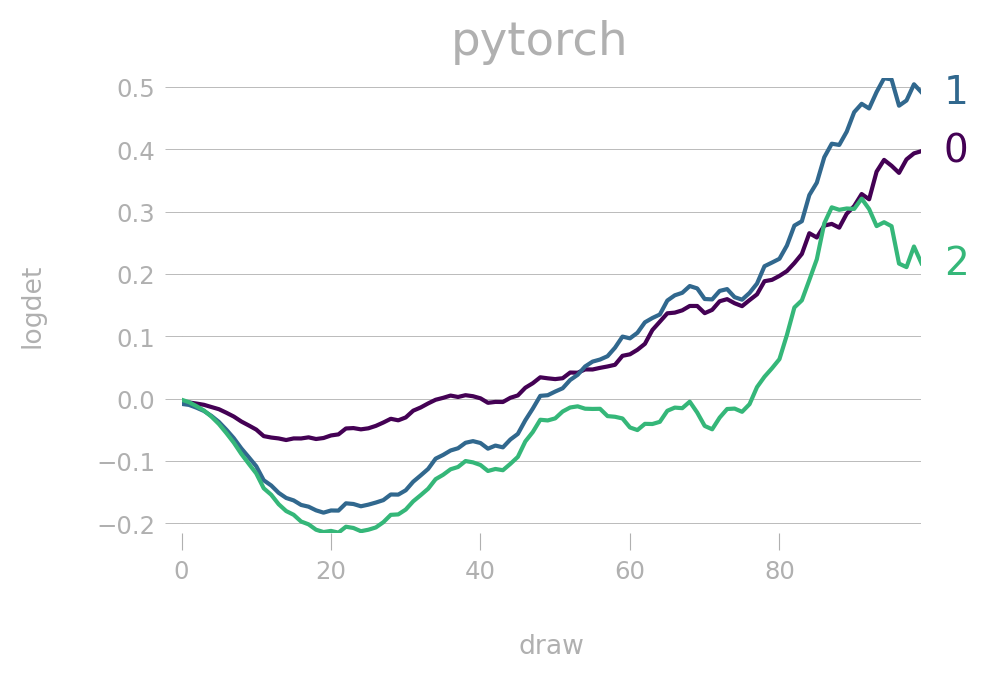

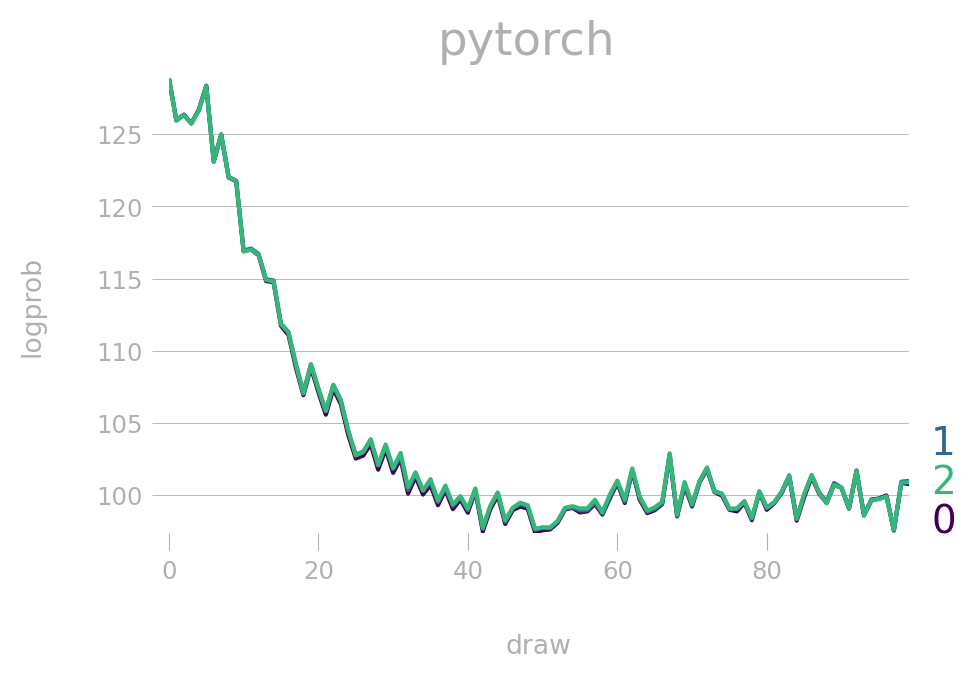

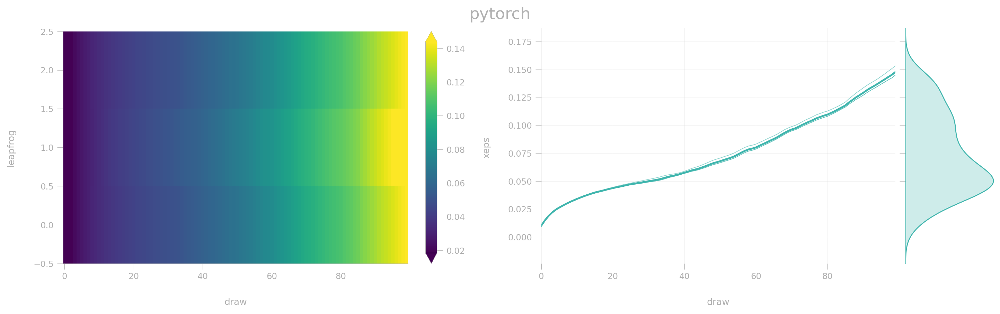

...

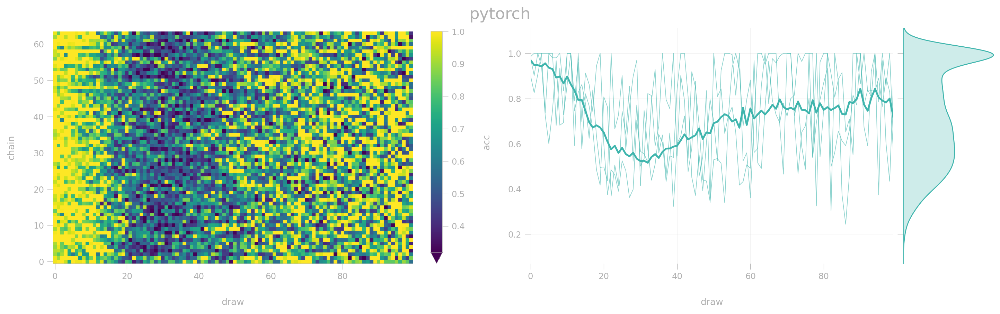

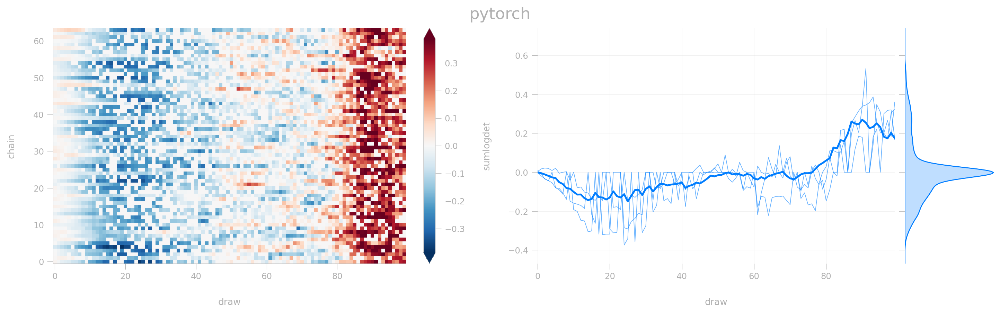

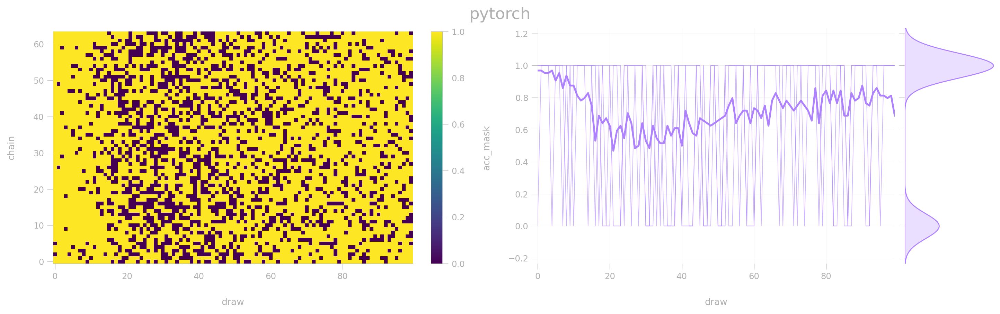

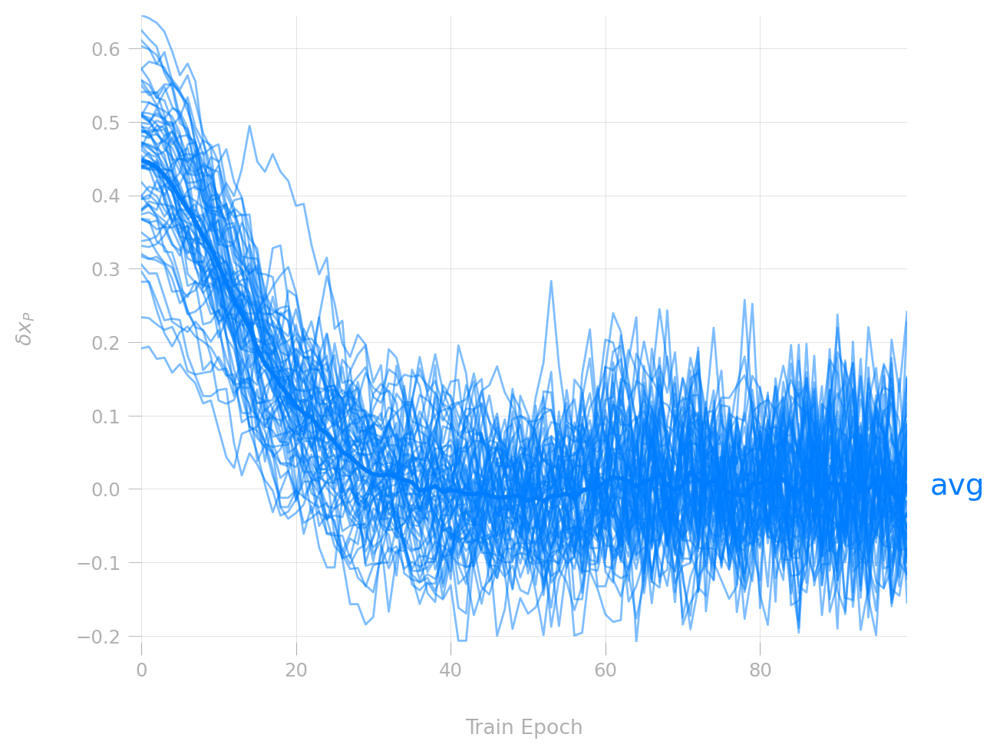

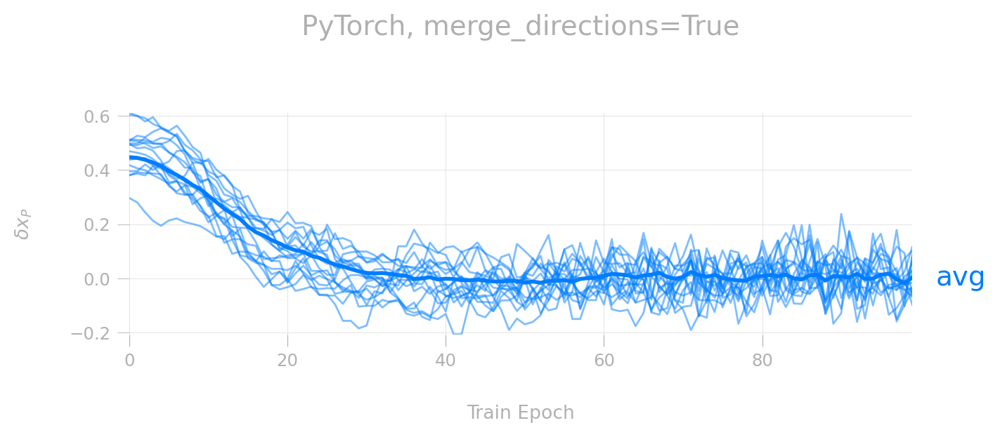

In [31]:
with plt.style.context(matplotx.styles.dufte):
    overrides = options['merge'] + OPTIONS
    config, output = train(framework='pytorch', overrides=overrides)
    outputs['pytorch']['merge'] = output
    configs['pytorch']['merge'] = config

    plot_plaqs_diffs(config, output)
    matplotx.line_labels()
    ax = plt.gca()
    ax.set_title('PyTorch, merge_directions=True')

## `merge_directions = False`

Output()

beta: 1.0
framework: pytorch
save_x: true
print_config: true
ignore_warnings: true
seed: null
compile: true
name: null
steps:
  nera: 10
  nepoch: 50
  test: 10
  log: 5
  print: 10
dynamics:
  xshape:
  - 64
  - 8
  - 8
  - 2
  eps: 0.01
  nleapfrog: 3
  eps_fixed: false
  use_ncp: true
  use_split_xnets: true
  use_separate_networks: true
  merge_directions: false
  verbose: true
loss:
  use_mixed_loss: true
  charge_weight: 0.01
  plaq_weight: 0.0
network:
  units:
  - 16
  - 16
  - 16
  - 16
  dropout_prob: 0.0
  activation_fn: relu
  use_batch_norm: false
net_weights:
  x:
    s: 1.0
    t: 1.0
    q: 1.0
  v:
    s: 1.0
    t: 1.0
    q: 1.0
debug_mode: false
width: 150
outdir: /Users/saforem2/projects/l2hmc-qcd/src/l2hmc/notebooks/outputs/jupyter/pytorch/2022-02-01/11-48-18



[11:48:39] Era 0 took: 20 s

           Avgs over last era:                                                                                                                        
            dt=0.38, loss=7.8, acc=0.93, acc_mask=0.93, sumlogdet=-0.002, fwd/energy=1.2e+02, fwd/logdet=0.022, fwd/logprob=1.2e+02, fwd/xeps=0.027,  
           fwd/veps=0.022, fwd/acc=0.93, fwd/sumlogdet=0.037, bwd/energy=1.2e+02, bwd/logdet=-0.03, bwd/logprob=1.2e+02, bwd/xeps=0.027,              
           bwd/veps=0.022, bwd/acc=0.95, bwd/sumlogdet=-0.041

Output()

[11:49:01] Era 1 took: 22 s

           Avgs over last era:                                                                                                                        
            dt=0.44, loss=-0.68, acc=0.87, acc_mask=0.88, sumlogdet=0.0058, fwd/energy=1.1e+02, fwd/logdet=0.049, fwd/logprob=1.1e+02, fwd/xeps=0.052,
           fwd/veps=0.048, fwd/acc=0.87, fwd/sumlogdet=0.072, bwd/energy=1.1e+02, bwd/logdet=-0.056, bwd/logprob=1.1e+02, bwd/xeps=0.052,             
           bwd/veps=0.048, bwd/acc=0.88, bwd/sumlogdet=-0.087

Output()

[11:49:21] Era 2 took: 20 s

           Avgs over last era:                                                                                                                        
            dt=0.39, loss=-6.5, acc=0.82, acc_mask=0.84, sumlogdet=0.00013, fwd/energy=1e+02, fwd/logdet=0.06, fwd/logprob=1e+02, fwd/xeps=0.074,     
           fwd/veps=0.069, fwd/acc=0.81, fwd/sumlogdet=0.072, bwd/energy=1e+02, bwd/logdet=-0.059, bwd/logprob=1e+02, bwd/xeps=0.074, bwd/veps=0.069, 
           bwd/acc=0.82, bwd/sumlogdet=-0.11

Output()

[11:49:43] Era 3 took: 22 s

           Avgs over last era:                                                                                                                        
            dt=0.42, loss=-11, acc=0.79, acc_mask=0.77, sumlogdet=-0.0028, fwd/energy=1e+02, fwd/logdet=0.084, fwd/logprob=1e+02, fwd/xeps=0.095,     
           fwd/veps=0.091, fwd/acc=0.79, fwd/sumlogdet=0.089, bwd/energy=99 , bwd/logdet=-0.066, bwd/logprob=99 , bwd/xeps=0.095, bwd/veps=0.091,     
           bwd/acc=0.79, bwd/sumlogdet=-0.14

Output()

[11:50:00] Era 4 took: 17 s

           Avgs over last era:                                                                                                                        
            dt=0.5, loss=-15, acc=0.76, acc_mask=0.76, sumlogdet=0.0065, fwd/energy=1e+02, fwd/logdet=0.061, fwd/logprob=1e+02, fwd/xeps=0.12,        
           fwd/veps=0.11, fwd/acc=0.76, fwd/sumlogdet=0.022, bwd/energy=99 , bwd/logdet=-0.0053, bwd/logprob=99 , bwd/xeps=0.12, bwd/veps=0.11,       
           bwd/acc=0.78, bwd/sumlogdet=-0.08

Output()

[11:50:19] Era 5 took: 19 s

           Avgs over last era:                                                                                                                        
            dt=0.3, loss=-22, acc=0.75, acc_mask=0.77, sumlogdet=0.0033, fwd/energy=1e+02, fwd/logdet=0.061, fwd/logprob=1e+02, fwd/xeps=0.14,        
           fwd/veps=0.13, fwd/acc=0.76, fwd/sumlogdet=0.0046, bwd/energy=99 , bwd/logdet=0.0049, bwd/logprob=99 , bwd/xeps=0.14, bwd/veps=0.13,       
           bwd/acc=0.75, bwd/sumlogdet=-0.08

Output()

[11:50:36] Era 6 took: 17 s

           Avgs over last era:                                                                                                                        
            dt=0.37, loss=-30, acc=0.72, acc_mask=0.71, sumlogdet=-0.011, fwd/energy=1e+02, fwd/logdet=0.12, fwd/logprob=99 , fwd/xeps=0.16,          
           fwd/veps=0.16, fwd/acc=0.74, fwd/sumlogdet=0.072, bwd/energy=1e+02, bwd/logdet=-0.03, bwd/logprob=1e+02, bwd/xeps=0.16, bwd/veps=0.16,     
           bwd/acc=0.73, bwd/sumlogdet=-0.16

Output()

[11:50:48] Era 7 took: 12 s

           Avgs over last era:                                                                                                                        
            dt=0.23, loss=-32, acc=0.75, acc_mask=0.74, sumlogdet=-0.0035, fwd/energy=1e+02, fwd/logdet=0.16, fwd/logprob=1e+02, fwd/xeps=0.18,       
           fwd/veps=0.18, fwd/acc=0.74, fwd/sumlogdet=0.07, bwd/energy=1e+02, bwd/logdet=0.0046, bwd/logprob=1e+02, bwd/xeps=0.18, bwd/veps=0.18,     
           bwd/acc=0.75, bwd/sumlogdet=-0.15

Output()

[11:51:00] Era 8 took: 12 s

           Avgs over last era:                                                                                                                        
            dt=0.21, loss=-40, acc=0.72, acc_mask=0.73, sumlogdet=0.0075, fwd/energy=1e+02, fwd/logdet=0.24, fwd/logprob=1e+02, fwd/xeps=0.2,         
           fwd/veps=0.19, fwd/acc=0.73, fwd/sumlogdet=0.2, bwd/energy=1e+02, bwd/logdet=-0.079, bwd/logprob=1e+02, bwd/xeps=0.2, bwd/veps=0.19,       
           bwd/acc=0.72, bwd/sumlogdet=-0.28

Output()

[11:51:15] Era 9 took: 15 s

           Avgs over last era:                                                                                                                        
            dt=0.3, loss=-48, acc=0.76, acc_mask=0.78, sumlogdet=-0.0039, fwd/energy=99 , fwd/logdet=0.21, fwd/logprob=99 , fwd/xeps=0.21,            
           fwd/veps=0.21, fwd/acc=0.75, fwd/sumlogdet=0.11, bwd/energy=1e+02, bwd/logdet=0.022, bwd/logprob=1e+02, bwd/xeps=0.21, bwd/veps=0.21,      
           bwd/acc=0.76, bwd/sumlogdet=-0.18

Text(0.5, 1.0, 'PyTorch, merge_directions=False')

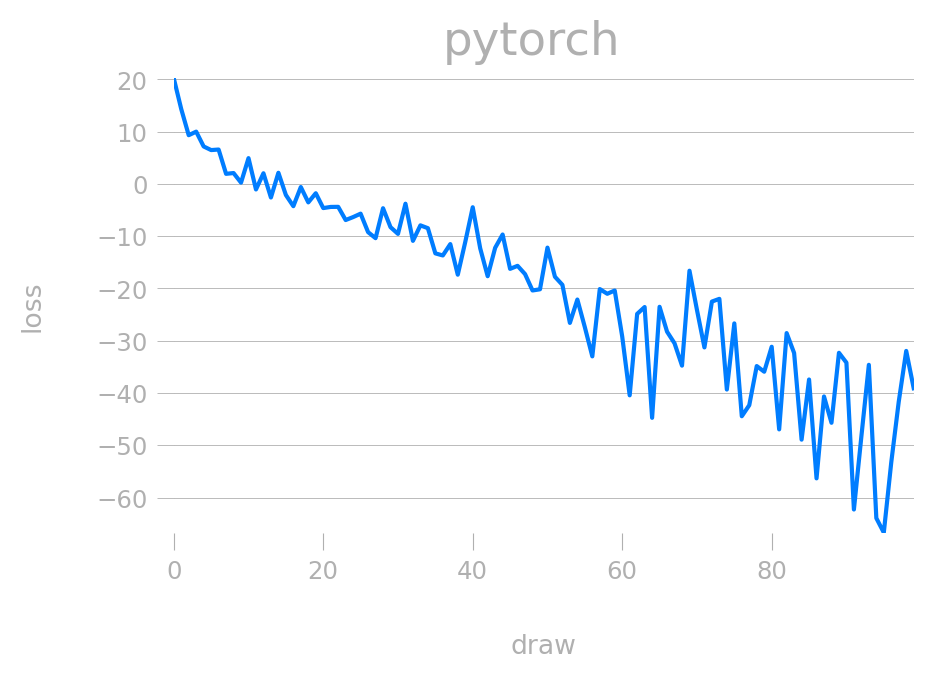

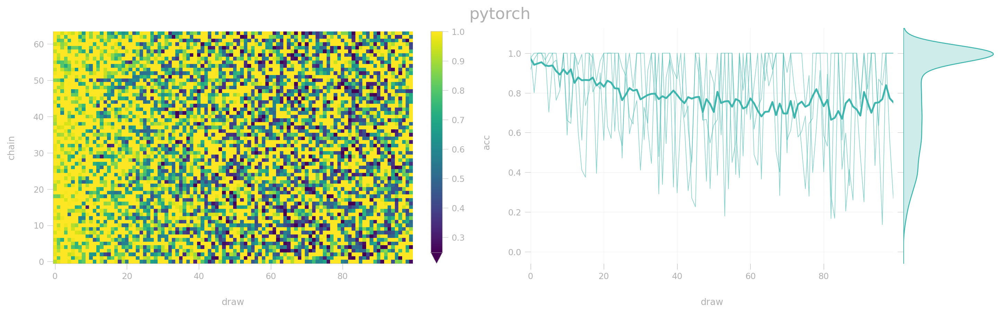

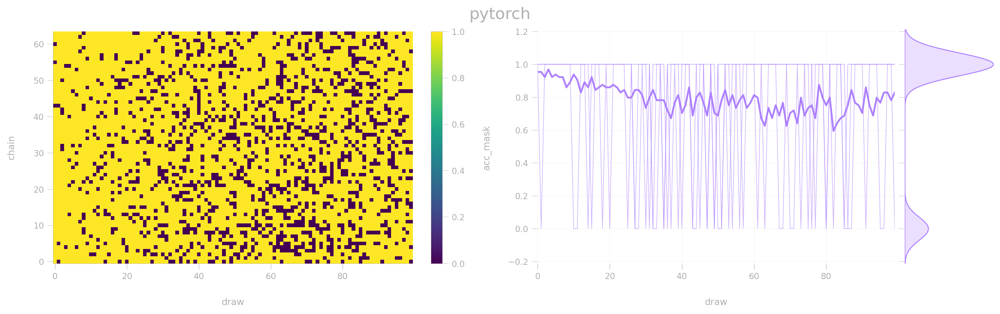

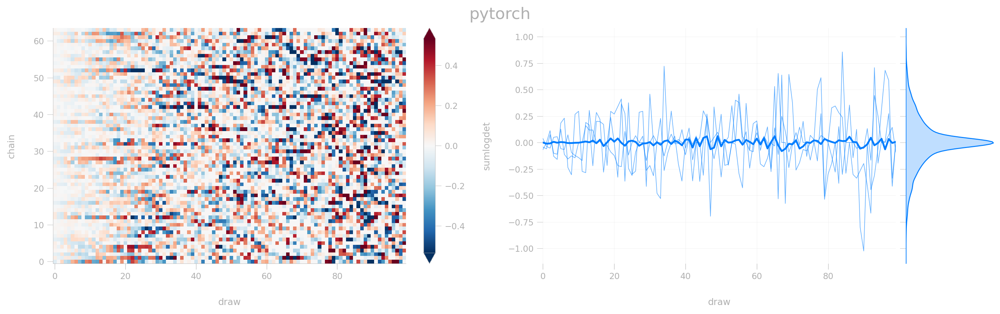

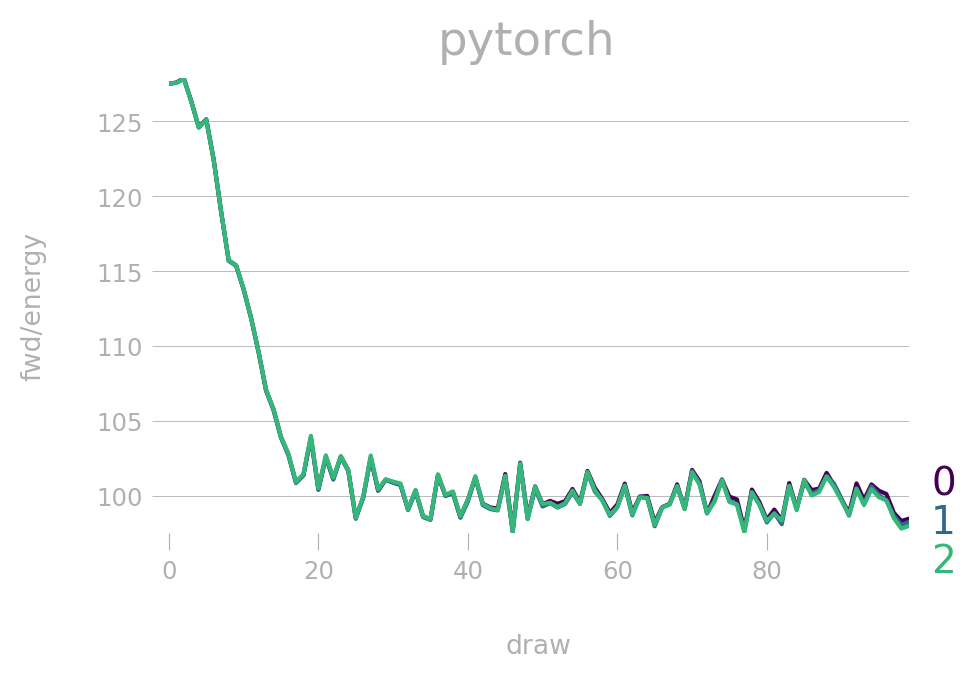

...

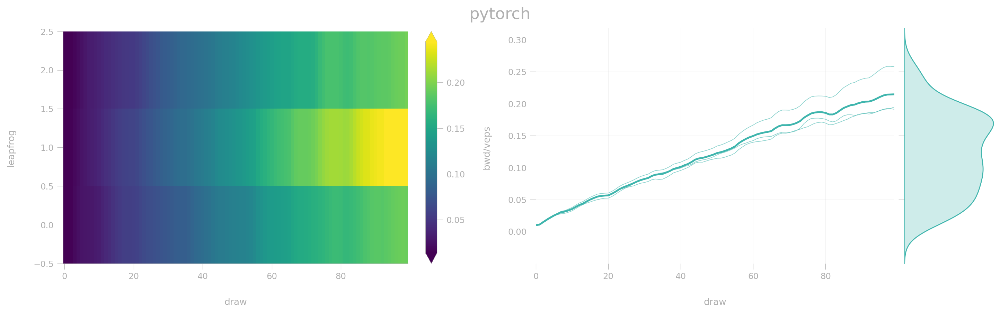

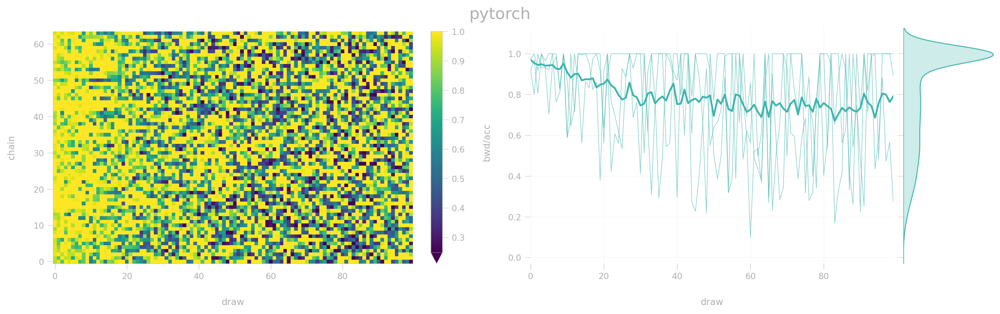

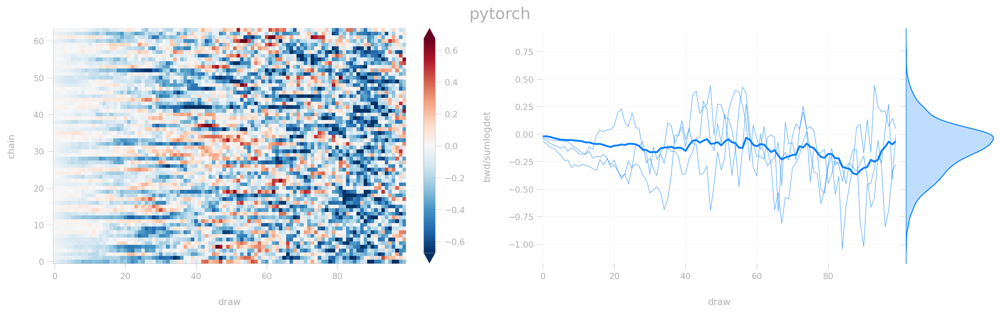

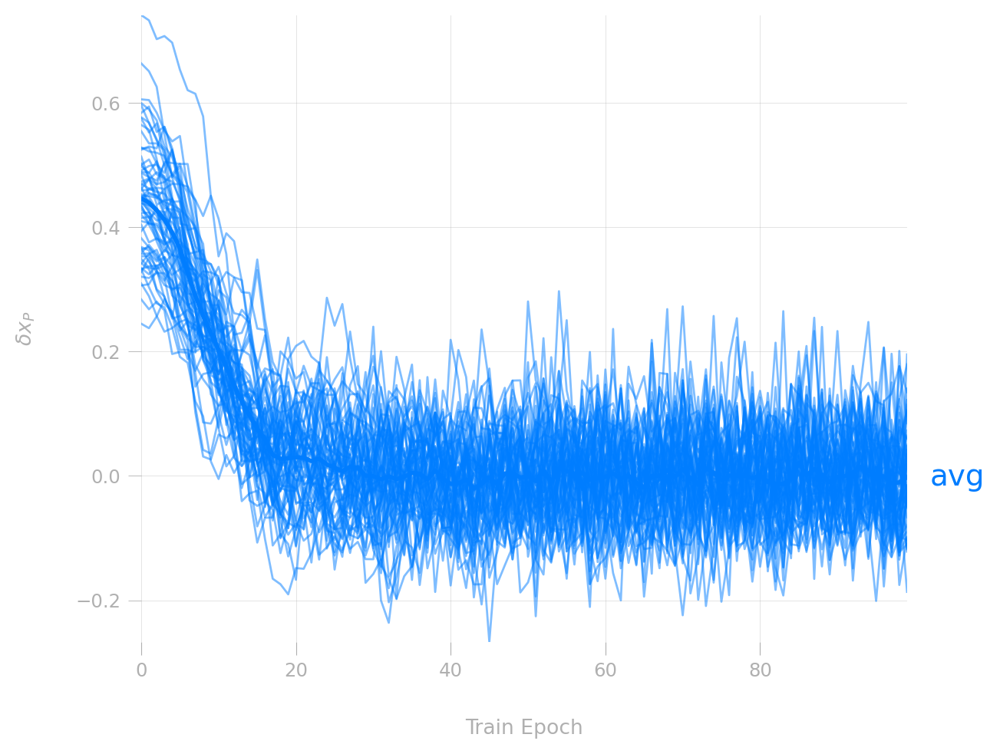

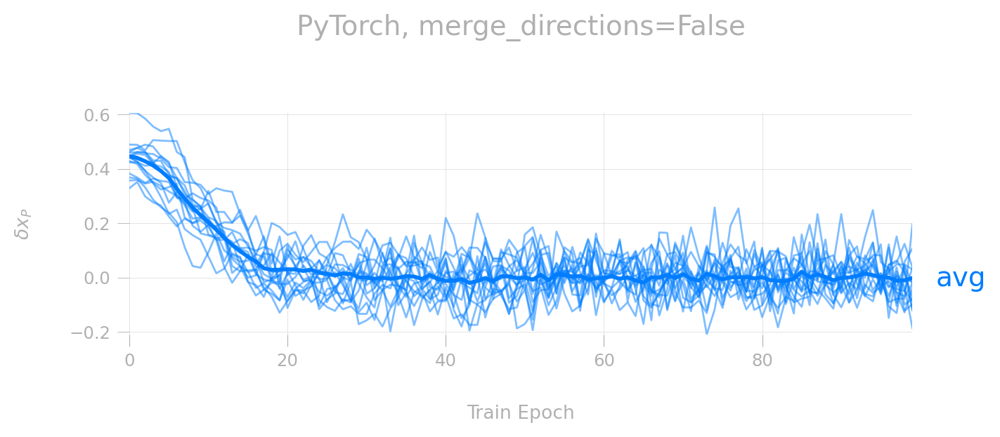

In [32]:
with plt.style.context(matplotx.styles.dufte):
    overrides = options['no_merge'] + OPTIONS
    config, output = train(framework='pytorch', overrides=overrides)
    outputs['pytorch']['no_merge'] = output
    configs['pytorch']['no_merge'] = config

    plot_plaqs_diffs(config, output)
    matplotx.line_labels()
    ax = plt.gca()
    ax.set_title('PyTorch, merge_directions=False')

## Look at differences

In [33]:
losses = {
    'tensorflow_merge': outputs['tensorflow']['merge']['history'].history['loss'],
    'tensorflow_no_merge': outputs['tensorflow']['no_merge']['history'].history['loss'],
    'pytorch_merge': outputs['pytorch']['merge']['history'].history['loss'],
    'pytorch_no_merge': outputs['pytorch']['no_merge']['history'].history['loss'],
}

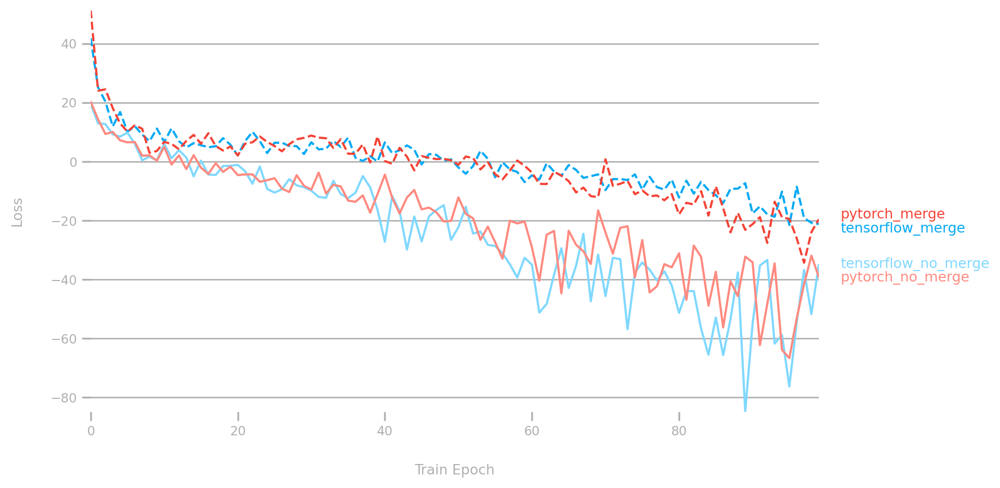

In [50]:
import matplotx
fig, ax = plt.subplots(figsize=(9, 5))

COLORS = {
    'blue': '#03A9F4',
    'alt_blue': '#80D8FF',
    'red': '#F44336',
    'alt_red': '#FF8A80',
}

styles = {
    'tensorflow_merge': {'color': COLORS['blue'], 'ls': '--'},
    'tensorflow_no_merge': {'color': COLORS['alt_blue'], 'ls': '-'},
    'pytorch_merge': {'color': COLORS['red'], 'ls': '--'},
    'pytorch_no_merge': {'color': COLORS['alt_red'], 'ls': '-'}
}
# colors = ['#FF5252', '#007DFF', '#63FF5b', '#AE81FF']
for key, val in losses.items():
    _ = ax.plot(val, label=key, **styles[key])

matplotx.line_labels(ax=ax)
_ = ax.grid(alpha=0.2, axis='x')
_ = ax.set_ylabel(r'Loss')
_ = ax.set_xlabel('Train Epoch')

In [ ]:
dataset_pt = output_pt['history'].get_dataset()
dataset_tf = output_tf['history'].get_dataset()

keys_pt = list(dataset_pt.data_vars.keys())
keys_tf = list(dataset_tf.data_vars.keys())
keys = set(keys_pt + keys_tf)
squared_diffs = {}
for key in keys:
    if key in keys_pt and key in keys_tf:
        val_pt = dataset_pt.data_vars[key]
        val_tf = dataset_tf.data_vars[key]
        squared_diffs[key] = val_pt - val_tf

squared_diffs = xr.Dataset(squared_diffs)

In [ ]:
from l2hmc.utils.plot_helpers import plot_dataset, plot_dataArray, make_ridgeplots

plt.rcParams.update({
    'axes.facecolor': (0, 0, 0, 0.0),
    'axes.edgecolor': (0, 0, 0, 0.0),
    'figure.facecolor': (0, 0, 0, 0.0),
    'figure.edgecolor': (0, 0, 0, 0.0),
})
with plt.style.context(matplotx.styles.dufte):
    for key, val in squared_diffs.data_vars.items():
        _ = plot_dataArray(val, key=key, num_chains=10)

In [ ]:
squared_diffs

In [ ]:
sns.set_context('notebook')
plt.style.use('~/.config/matplotlib/stylelib/molokai.mplstyle')
plt.rcParams['figure.dpi'] = 100
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['image.cmap'] = 'viridis'

from l2hmc.common import plot_dataset

dataset_tf = output_tf['history'].get_dataset()
with plt.style.context(matplotx.styles.dufte):
    plot_dataset(dataset_tf, nchains=10, title='TensorFlow')

In [ ]:
dynamics_tf = output_tf['dynamics']
lattice_tf = output_tf['lattice']
xarr_tf = output_tf['xarr']
plaqs_tf = []
for x in xarr_tf:
    plaqs_tf.append(lattice_tf.plaqs_diff(beta=cfg.get('beta'), x=x))
    
plaqs_tf = np.array(plaqs_tf)
ndraws, nchains = plaqs_tf.shape
xplot = np.arange(ndraws)
with plt.style.context(matplotx.styles.dufte):
    fig, ax = plt.subplots(figsize=FIGSIZE, constrained_layout=True)
    _ = ax.plot(xplot, plaqs_tf.mean(-1), label='avg', lw=2.0, color='C0');
    for idx in range(16):
        _ = ax.plot(xplot, plaqs_tf[:, idx], lw=1.0, alpha=0.5, color='C0')

    _ = ax.set_ylabel(r'$\delta x_{P}$')
    _ = ax.set_xlabel('Train Epoch')
    _ = ax.grid(True, alpha=0.4)

In [ ]:
from l2hmc.common import plot_dataset

title =  cfg.get('framework', None)
dataset_pt = output_pt['history'].get_dataset()
plot_dataset(dataset_pt, nchains=10, title=title)

In [ ]:
dynamics_tf = output_tf['dynamics']
lattice_tf = output_tf['lattice']

xarr_tf = xtf.values
xarr_tf.shape

In [ ]:
xarr_tf = xarr_tf.transpose((2, 1, 0))
xarr_tf.shape

In [ ]:
cfg.get('beta')

In [ ]:
plaqs_tf.shape

In [ ]:
dynamics_tf = output_tf['dynamics']
lattice_tf = output_tf['lattice']
xarr_tf = output_tf['xarr']
plaqs_tf = []
for x in xarr_tf:
    plaqs_tf.append(lattice_tf.plaqs_diff(beta=cfg.get('beta'), x=x))
    
plaqs_tf = np.array(plaqs_tf)
ndraws, nchains = plaqs_tf.shape
xplot = np.arange(ndraws)
fig, ax = plt.subplots(figsize=FIGSIZE, constrained_layout=True)
_ = ax.plot(xplot, plaqs_tf.mean(-1), label='avg', lw=2.0, color='C0');
for idx in range(16):
    _ = ax.plot(xplot, plaqs_tf[:, idx], lw=1.0, alpha=0.5, color='C0')
    
_ = ax.set_ylabel(r'$\delta x_{P}$')
_ = ax.set_xlabel('Train Epoch')
_ = ax.grid(True, alpha=0.4)

## Train `pytorch`

In [ ]:
sns.set_context('notebook')
plt.style.use('~/.config/matplotlib/stylelib/molokai.mplstyle')
plt.rcParams['figure.dpi'] = 100
sns.set_palette(['#00CCFF', '#FF5252', '#63FF5B', '#AE81FF', '#Fd971f'])
plt.rcParams['image.cmap'] = 'viridis'

from l2hmc.utils.plot_helpers import plot_dataset, plot_dataArray, make_ridgeplots

dataset_pt = output_pt['history'].get_dataset()
with plt.style.context(matplotx.styles.dufte):
    for key, val in dataset_pt.data_vars.items():
        _ = plot_dataArray(val, key=key, num_chains=10)
    #_ = plot_dataset(dataset_pt)

In [ ]:
from l2hmc.utils.plot_helpers import plot_combined

plot_combined(dataset_pt['acc'], key='acc', n)

In [ ]:
xdict = output_tf['xdict']
lattice = output_tf['lattice']
xdict.keys()

In [ ]:
xarr = np.array(list(xdict.values()))
xarr.shape

In [ ]:
plaqs_diff = []
for x in xarr:
    plaq_diff = lattice.plaqs_diff(beta=1., x=x)
    plaqs_diff.append(plaq_diff)
    
plaqs_diff = np.array(plaqs_diff)
plaqs_diff.shape

In [ ]:
plaqs_diff[2:].mean()